AI generated optimizer. Sounds good; doesn't work.

In [8]:
# prompt: a bigram language generator trained on a list of names from Social Security's website using PyTorch

import torch
import torch.nn as nn
import torch.nn.functional as F

class BigramLanguageModel(nn.Module):

    def __init__(self, vocab_size):
        super(BigramLanguageModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, 128)
        self.linear1 = nn.Linear(128, 128)
        self.linear2 = nn.Linear(128, vocab_size)

    def forward(self, x):
        h = F.relu(self.embedding(x))
        h = F.relu(self.linear1(h))
        return self.linear2(h)

# Load the names dataset
names = open('names.txt').read().split('\n')

# Build the vocabulary
vocab = set(names)
vocab_size = len(vocab)

# Create the model
model = BigramLanguageModel(vocab_size)

# Train the model
optimizer = torch.optim.Adam(model.parameters())
for epoch in range(10):
    for name in names:
        # One-hot encode the name
        x = torch.zeros(len(name), vocab_size)
        for i, char in enumerate(name):
            x[i, vocab.index(char)] = 1

        # Forward pass
        y_pred = model(x)

        # Compute the loss
        loss = F.cross_entropy(y_pred, x)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

# Generate text
start = 'Jo'
for i in range(100):
    # One-hot encode the start string
    x = torch.zeros(len(start), vocab_size)
    for i, char in enumerate(start):
        x[i, vocab.index(char)] = 1

    # Forward pass
    y_pred = model(x)

    # Sample the next character
    probs = F.softmax(y_pred, dim=1)
    next_char = torch.multinomial(probs, 1)

    # Update the start string
    start += vocab[next_char.item()]

# Print the generated text
print(start)


AttributeError: 'set' object has no attribute 'index'

Time to follow Karpathy's lead - coming from https://www.youtube.com/watch?v=PaCmpygFfXo&list=WL&index=126

In [1]:
words = open('names.txt', 'r').read().splitlines()

In [2]:
words = [word.lower() for word in words]
words[:10]

['olivia',
 'emma',
 'charlotte',
 'amelia',
 'sophia',
 'isabella',
 'ava',
 'mia',
 'evelyn',
 'luna']

In [6]:
bigrams = {}
for w in words:
  chs = ['<S>'] + list(w) + ['<E>']
  for ch1, ch2 in zip(chs, chs[1:]):
    bigram = (ch1, ch2)
    bigrams[bigram] = bigrams.get(bigram, 0) + 1

In [7]:
# prompt: sort bigrams dictionary descending by value

sorted_bigrams = sorted(bigrams.items(), key=lambda item: item[1], reverse=True)
print(sorted_bigrams)

[(('a', '<E>'), 6337), (('n', '<E>'), 6306), (('a', 'n'), 5243), (('<S>', 'a'), 4375), (('e', '<E>'), 3918), (('a', 'r'), 3257), (('e', 'l'), 3235), (('r', 'i'), 3009), (('i', '<E>'), 2955), (('<S>', 'k'), 2922), (('n', 'a'), 2824), (('l', 'e'), 2792), (('l', 'a'), 2743), (('m', 'a'), 2630), (('<S>', 'm'), 2540), (('e', 'n'), 2524), (('l', 'i'), 2499), (('a', 'l'), 2494), (('r', 'a'), 2326), (('i', 'a'), 2319), (('h', '<E>'), 2317), (('o', 'n'), 2261), (('a', 'h'), 2252), (('<S>', 'j'), 2242), (('h', 'a'), 2154), (('<S>', 's'), 2085), (('y', 'a'), 2060), (('i', 'n'), 2053), (('y', '<E>'), 2047), (('a', 'y'), 1996), (('e', 'r'), 1888), (('n', 'i'), 1855), (('a', 'i'), 1771), (('n', 'n'), 1713), (('y', 'n'), 1712), (('k', 'a'), 1712), (('<S>', 'r'), 1687), (('r', 'e'), 1671), (('a', 'm'), 1646), (('i', 'e'), 1633), (('<S>', 'e'), 1624), (('<S>', 'l'), 1576), (('<S>', 'd'), 1564), (('r', '<E>'), 1522), (('l', 'y'), 1488), (('<S>', 'c'), 1467), (('i', 'l'), 1382), (('j', 'a'), 1346), (('l'

In [8]:
import torch

ModuleNotFoundError: No module named 'torch'

In [6]:
N = torch.zeros((27, 27), dtype=torch.int32)

In [5]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [6]:
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        N[ix1, ix2] += 1

NameError: name 'N' is not defined

<Figure size 1600x1600 with 0 Axes>

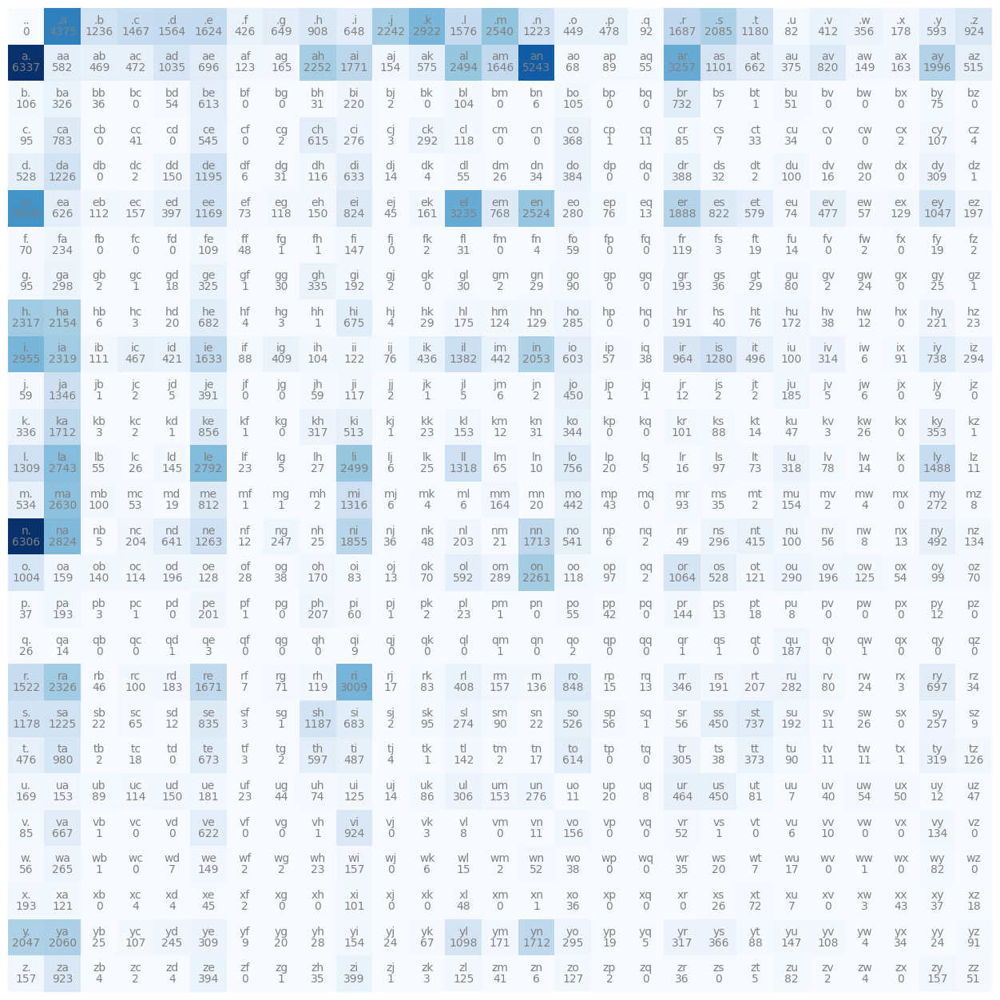

In [75]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(16, 16))
plt.figure(figsize=(16,16))
plt.imshow(N, cmap='Blues')
for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha="center", va="bottom", color='gray')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='gray')
plt.axis('off');

In [102]:
N[:,0]

tensor([   0, 6337,  106,   95,  528, 3918,   70,   95, 2317, 2955,   59,  336,
        1309,  534, 6306, 1004,   37,   26, 1522, 1178,  476,  169,   85,   56,
         193, 2047,  157], dtype=torch.int32)

In [103]:
p = N[0].float()
p = p/p.sum()
p

tensor([0.0000, 0.1371, 0.0387, 0.0460, 0.0490, 0.0509, 0.0133, 0.0203, 0.0284,
        0.0203, 0.0702, 0.0916, 0.0494, 0.0796, 0.0383, 0.0141, 0.0150, 0.0029,
        0.0529, 0.0653, 0.0370, 0.0026, 0.0129, 0.0112, 0.0056, 0.0186, 0.0290])

In [104]:
g = torch.Generator().manual_seed(214783647)
ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
print(itos[ix])


m


In [105]:
P.sum(1, keepdim=True).shape

torch.Size([27, 1])

In [145]:
# Adding fake 1 count to all transitions to prevent going to infinity in log
# likelihood of unseen bigrams. More addition will make it a more uniform model.
P = (N+1).float()
P /= P.sum(1, keepdim=True)

In [125]:
P[0].sum()

tensor(1.0000)

In [146]:
g = torch.Generator().manual_seed(2147483647)

for i in range(10): 
  out = []
  ix = 0
  while True:
    p = P[ix]
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
      break
  print(''.join(out))

cexze.
momakurailazityharellimittain.
llayn.
ka.
da.
staiyaubrtthrigotai.
moliellavo.
ke.
teda.
ka.


In [148]:
# Print the log likehood of our data set
log_likelihood = 0.0
n = 0
# Alternative probability to show a worse approximation: uniform guessing.
# P = torch.ones((27, 27), dtype=torch.float)/27
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1, ix2]
        logprob = torch.log(prob)
        log_likelihood += logprob
        print(f'{ch1}{ch2}: {prob:.4f} {logprob}')
        n += 1
print(f'{log_likelihood=}')
nll = -log_likelihood
print(f'{nll=}')
print(f'{nll/n}')

.o: 0.0141 -4.262460708618164
ol: 0.0734 -2.611457586288452
li: 0.1792 -1.7192604541778564
iv: 0.0175 -4.046997547149658
vi: 0.3416 -1.0741719007492065
ia: 0.1287 -2.05024790763855
a.: 0.1904 -1.6587238311767578
.e: 0.0509 -2.978445291519165
em: 0.0386 -3.255542516708374
mm: 0.0244 -3.7113523483276367
ma: 0.3898 -0.94217848777771
a.: 0.1904 -1.6587238311767578
.c: 0.0460 -3.080052137374878
ch: 0.1786 -1.7225927114486694
ha: 0.2908 -1.2351746559143066
ar: 0.0979 -2.32417368888855
rl: 0.0324 -3.4294815063476562
lo: 0.0543 -2.913943290710449
ot: 0.0151 -4.192630767822266
tt: 0.0703 -2.654784917831421
te: 0.1267 -2.065810441970825
e.: 0.1965 -1.6270416975021362
.a: 0.1370 -1.9878180027008057
am: 0.0495 -3.0063316822052
me: 0.1204 -2.1165666580200195
el: 0.1623 -1.8185402154922485
li: 0.1792 -1.7192604541778564
ia: 0.1287 -2.05024790763855
a.: 0.1904 -1.6587238311767578
.s: 0.0653 -2.7287046909332275
so: 0.0655 -2.7252326011657715
op: 0.0121 -4.411684513092041
ph: 0.1983 -1.6180545091629028

In [157]:
# create the training set of bigrams (x,y)
xs, ys = [], []

for w in words[:1]:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    print(ch1, ch2)
    xs.append(ix1)
    ys.append(ix2)
    
xs = torch.tensor(xs)
ys = torch.tensor(ys)

. o
o l
l i
i v
v i
i a
a .
tensor([ 0, 15, 12,  9, 22,  9,  1])


In [150]:
xs

tensor([ 0, 15, 12,  9, 22,  9,  1])

In [161]:
import torch.nn.functional as F
xenc = F.one_hot(xs, num_classes=27).float()
xenc.shape

torch.Size([7, 27])

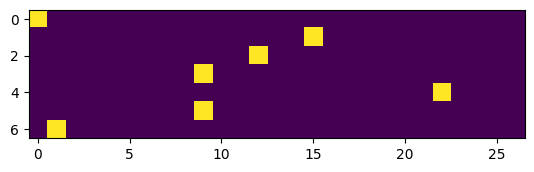

In [156]:
plt.imshow(xenc)

In [158]:
xenc.dtype

torch.float32

In [162]:
W = torch.randn((27, 27))
xenc @ W

tensor([[ 0.2198,  1.5837,  0.5201,  0.1090, -0.3963, -0.1289,  1.2163,  0.0706,
         -0.2044,  0.6034, -0.5041, -0.0804,  0.8076,  1.0804,  0.6363, -0.0611,
          1.0339,  1.7059,  1.8031,  0.5491,  1.6186, -2.1367, -0.1285, -0.7096,
          1.4429,  1.4252,  0.3498],
        [-0.1217,  0.1173, -1.7581, -0.8905,  0.8924,  2.4846,  0.5124, -1.1096,
          0.7570, -0.3699, -0.8362, -0.6018, -2.6585, -1.7857,  0.7053,  1.0003,
         -0.5475,  0.0583,  0.2943, -0.1726, -0.4839,  1.4207,  0.2562,  0.0797,
          1.6453,  0.1971,  0.5329],
        [ 0.5820, -0.1724,  0.5046, -1.2813,  1.7720,  0.2832, -0.3648, -0.7337,
         -1.5851, -0.4222, -1.4472,  0.2829,  0.6303, -1.0673, -0.8153, -0.3534,
          0.9963, -0.3802,  1.3393, -0.1980,  1.4082,  0.4028, -0.9644,  0.4622,
         -0.3641, -1.0389,  0.0798],
        [-0.4093,  0.4640, -2.2460,  0.9671, -0.2697, -0.5396, -0.5857,  0.1813,
          2.2042, -1.1356, -0.4143,  0.9260,  0.6487,  1.5611,  0.4266,  1.1742

In [174]:
logits = xenc @ W # log-counts
counts = logits.exp() # equivalent N
prob = counts / counts.sum(1, keepdims=True)
prob

tensor([[0.0209, 0.0818, 0.0282, 0.0187, 0.0113, 0.0148, 0.0566, 0.0180, 0.0137,
         0.0307, 0.0101, 0.0155, 0.0376, 0.0495, 0.0317, 0.0158, 0.0472, 0.0924,
         0.1019, 0.0291, 0.0847, 0.0020, 0.0148, 0.0083, 0.0711, 0.0698, 0.0238],
        [0.0189, 0.0240, 0.0037, 0.0088, 0.0521, 0.2559, 0.0356, 0.0070, 0.0455,
         0.0147, 0.0092, 0.0117, 0.0015, 0.0036, 0.0432, 0.0580, 0.0123, 0.0226,
         0.0286, 0.0180, 0.0131, 0.0883, 0.0276, 0.0231, 0.1106, 0.0260, 0.0364],
        [0.0491, 0.0231, 0.0454, 0.0076, 0.1614, 0.0364, 0.0190, 0.0132, 0.0056,
         0.0180, 0.0065, 0.0364, 0.0515, 0.0094, 0.0121, 0.0193, 0.0743, 0.0188,
         0.1047, 0.0225, 0.1122, 0.0410, 0.0105, 0.0436, 0.0191, 0.0097, 0.0297],
        [0.0148, 0.0355, 0.0024, 0.0587, 0.0170, 0.0130, 0.0124, 0.0268, 0.2024,
         0.0072, 0.0148, 0.0564, 0.0427, 0.1064, 0.0342, 0.0722, 0.0129, 0.0260,
         0.0246, 0.0086, 0.0133, 0.0068, 0.1087, 0.0058, 0.0112, 0.0042, 0.0609],
        [0.0518, 0.0438,

In [176]:
prob = nn.Softmax(dim=1)(xenc @ W) # softmax is equivalent to above

In [9]:
# create the dataset
xs, ys = [], []
for w in words:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    xs.append(ix1)
    ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

number of examples:  225068


In [12]:
# gradient descent
for k in range(1000):
  
  # forward pass
  xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
  logits = xenc @ W # predict log-counts
  counts = logits.exp() # counts, equivalent to N
  probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
  loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
  print(loss.item())
  
  # backward pass
  W.grad = None # set to zero the gradient
  loss.backward()
  
  # update
  W.data += -50 * W.grad

3.385798692703247
3.168761730194092
3.035391092300415
2.9435689449310303
2.8770668506622314
2.8270270824432373
2.787900924682617
2.756298542022705
2.730104684829712
2.7079591751098633
2.688959836959839
2.6724839210510254
2.6580810546875
2.6454126834869385
2.634211540222168
2.6242611408233643
2.6153810024261475
2.6074228286743164
2.6002602577209473
2.593787908554077
2.587916612625122
2.582571029663086
2.5776870250701904
2.5732107162475586
2.569094657897949
2.5652995109558105
2.561791181564331
2.558539390563965
2.5555193424224854
2.5527079105377197
2.550086498260498
2.547637462615967
2.5453453063964844
2.5431969165802
2.541180372238159
2.5392849445343018
2.5375006198883057
2.535818099975586
2.5342304706573486
2.5327303409576416
2.531310796737671
2.529966115951538
2.5286917686462402
2.5274813175201416
2.526331901550293
2.525238275527954
2.5241971015930176
2.523205041885376
2.522258758544922
2.5213558673858643
2.520493268966675
2.5196685791015625
2.5188791751861572
2.5181236267089844
2.517

In [13]:
# finally, sample from the 'neural net' model
g = torch.Generator().manual_seed(2147483647)

for i in range(5):
  
  out = []
  ix = 0
  while True:
    
    # ----------
    # BEFORE:
    #p = P[ix]
    # ----------
    # NOW:
    xenc = F.one_hot(torch.tensor([ix]), num_classes=27).float()
    logits = xenc @ W # predict log-counts
    counts = logits.exp() # counts, equivalent to N
    p = counts / counts.sum(1, keepdims=True) # probabilities for next character
    # ----------
    
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
      break
  print(''.join(out))

cexze.
momakurailazityharellimittain.
llayn.
ka.
da.
